In [1]:
import numpy as np
import os

# Plotting
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import colors
import matplotlib.gridspec as grid_spec
from mpl_toolkits.axes_grid1 import make_axes_locatable
import plotly.express as px
# Ridgeline plots
import joypy
import yaml

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score

import pandas as pd
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

from src.parameter_distributions import parameter_distributions
from src.feature_extraction import coarsen_density, scale_density, scale_population_curves, split_data
from src.cluster_data import generate_param_labels, compute_oos, generate_confusion_matrix, plot_confusion_matrix_and_OOS

assert os.path.isfile("../data/dataset2/density.npy")
assert os.path.isfile("../data/dataset2/cell_counts.npy")

In [2]:
import sys, importlib

import pyximport
pyximport.install(setup_args={'include_dirs': np.get_include()},
                  language_level = 3
                 )
import src.ks_statistic as ks

In [3]:
num_clusters = 4
pca = PCA(n_components = 3, random_state = 0)
kmeans = KMeans(n_clusters = num_clusters,n_init = 'auto', random_state = 0)
pipeline = Pipeline(steps=[("pca", pca), ("kmeans", kmeans)])


# **Density**

In [4]:
if not os.path.isfile("../data/dataset2/8x8_density.npy"):
    
    old_density = np.load("../data/dataset2/density.npy", allow_pickle = True)
 
    coarse_resolution = (25)**2
    density = np.empty((45*121*10, coarse_resolution))
    for i, v in enumerate(old_density):
        v = v.reshape(200,200)
        coarse_v = coarsen_density(v, I = 200, h = 1000/(199.0), bin_size = 8)
        density[i] = coarse_v
    
    np.save("../data/dataset2/8x8_density.npy", density, allow_pickle = True)

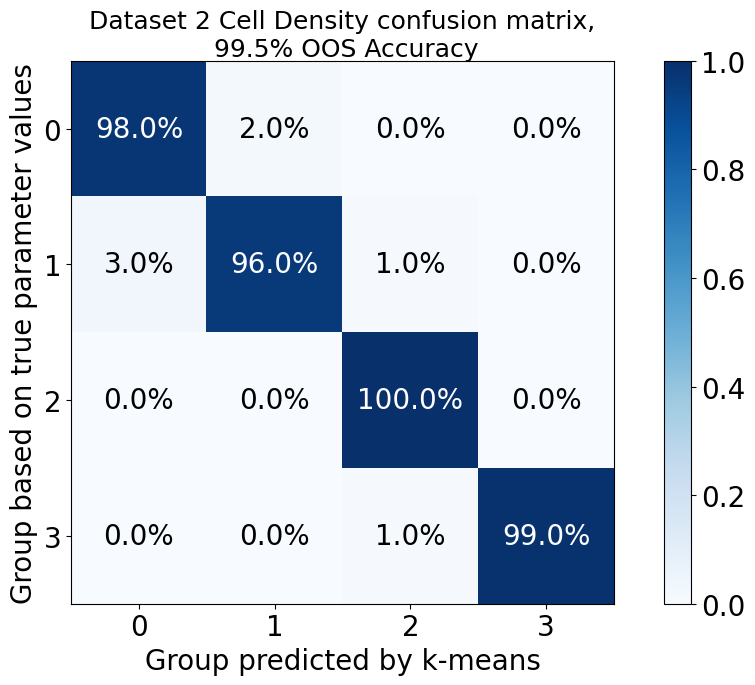

In [5]:
density = np.load("../data/dataset2/8x8_density.npy",allow_pickle = True)
density_train, density_test = split_data(density, itr_cutoff = 5)

density_train, density_test = scale_density(density_train, density_test)
density_train = density_train.reshape((27225,25**2))
density_test = density_test.reshape((27225,25**2))

density_train_labels = pipeline.fit_predict(density_train)
density_predicted_test_labels = pipeline.predict(density_test)
density_train_reduced = pca.transform(density_train)
var = pca.explained_variance_ratio_

with open("../src/parameters.yaml") as p:
        params = yaml.safe_load(p)
        dataset2_info = params["dataset2"]
param_combinations = dataset2_info['parameter_combinations']

labels = {}
c_a_vec = []
c_a_range = np.logspace(np.log2(0.2), np.log2(0.8), 11, base = 2)
for i, combo in enumerate(param_combinations):
    labels[combo] = density_train_labels[i*605:(i+1)*605].reshape((121,5))
    if 'c_a' in combo.split(','):
        c_a_vec.append(np.repeat(c_a_range,11))
    else:
        c_a_vec.append(np.full(shape = 121,
                               fill_value = 0.4))
c_a_vec = np.array(c_a_vec).flatten()
        
param_labels, _ = generate_param_labels(param_combinations = param_combinations,
                                     labels = labels,
                                     n_iterations = 5,
                                     n_param_value_combos = 121)


common_label = []
for combo in param_labels.keys():
    common_label.append(param_labels[combo])
common_label = np.array(common_label, dtype = int).flatten()

c_a_means = np.zeros(num_clusters)
for c in np.arange(num_clusters):
    c_a_means[c] = np.mean(c_a_vec[common_label == c])


common_label_copy = np.zeros(common_label.shape)
density_train_labels_copy = np.zeros(density_train_labels.shape)
density_predicted_test_labels_copy = np.zeros(density_predicted_test_labels.shape)

for iold, inew in enumerate(np.argsort(c_a_means)):
    common_label_copy[common_label == inew] = iold
    density_train_labels_copy[density_train_labels == inew] = iold
    density_predicted_test_labels_copy[density_predicted_test_labels == inew] = iold
    


cm = generate_confusion_matrix(np.repeat(common_label_copy, 5), density_predicted_test_labels_copy, num_clusters)
cm_fig = plot_confusion_matrix_and_OOS(confusion_matrix = cm,
                                       y_true = np.repeat(common_label_copy, 5),
                                       y_pred = density_predicted_test_labels_copy,
                                       n_clusters = num_clusters,
                                       xlabel = "Group predicted by k-means",
                                       ylabel = "Group based on true parameter values",
                                       title = "Dataset 2 Cell Density");
cm_fig.savefig("../figures/dataset2/density_confusion_matrix.png")

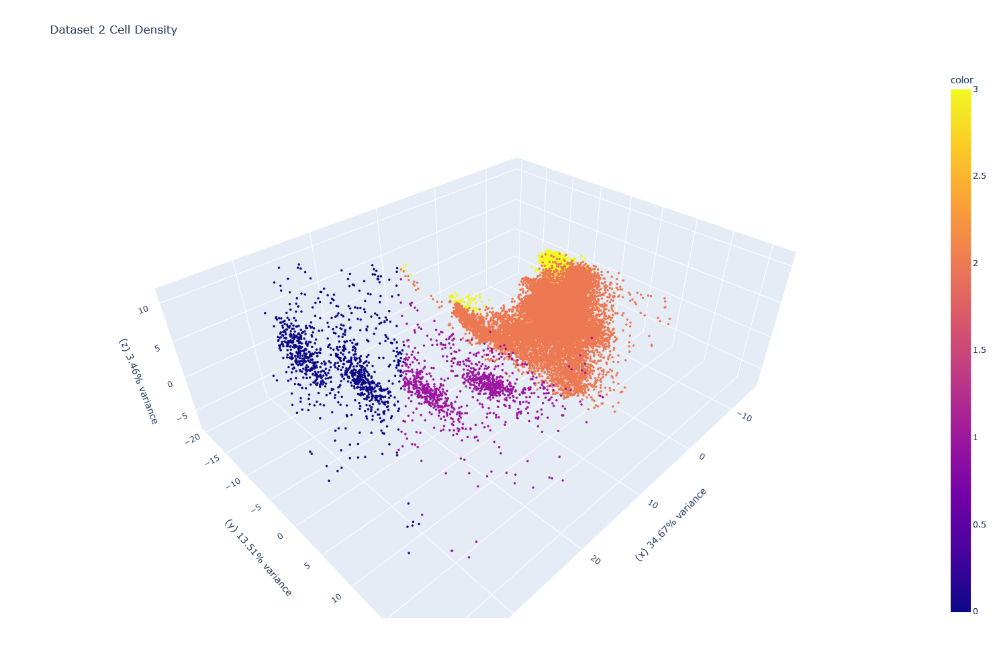

In [6]:
pca_fig = px.scatter_3d(x=density_train_reduced[:, 0],
                        y=density_train_reduced[:, 1],
                        z=density_train_reduced[:, 2],
                        color=density_train_labels_copy, labels = {'x': f"(x) {100*var[0]:.2f}% variance",
                                                              'y': f"(y) {100*var[1]:.2f}% variance",
                                                              'z':f"(z) {100*var[2]:.2f}% variance"},
                        title = "Dataset 2 Cell Density")

pca_fig.update_traces(marker={'size': 2})
pca_fig.update_layout(autosize=False,
                             width = 1200,
                             height = 1000)
     
pca_fig.show()

cluster_distns = []
for cluster_num in np.arange(num_clusters):
    cluster_distn = parameter_distributions(labels = density_train_labels_copy,
                                            cluster_num = cluster_num,
                                            n_itrs = 5)
    cluster_distns.append(cluster_distn)

In [7]:
ks_stats = {}
permutation_test_iterations = 1000
for param in cluster_distns[0].keys():
    ks_stats[param] = []
    for c1 in np.arange(num_clusters):
        for c2 in np.arange(c1 + 1, num_clusters):
            p_val = ks.ks_disc_2sample(samples1 = cluster_distns[c1][param],
                                       samples2 = cluster_distns[c2][param],
                                       iters = permutation_test_iterations)
            ks_stats[param].append(p_val)
    ks_stats[param] = np.array(ks_stats[param])

ks_df = pd.DataFrame.from_dict(data = ks_stats,
                               orient = 'index',
                               columns = [f"({c1},{c2})" for c1 in np.arange(num_clusters) for c2 in np.arange(c1+1, num_clusters)])
ks_df.index = list(ks_stats.keys())

ks_df.to_csv(f'density_ks_stats_{permutation_test_iterations}.csv')
display(ks_df)

,"(0,1)","(0,2)","(0,3)","(1,2)","(1,3)","(2,3)"
c_a,0.000,0.000,0.000,0.000,0.000,0.000
c_d,0.000,0.061,0.000,0.028,0.000,0.001
c_m,0.696,0.572,0.967,0.965,0.778,0.262
dmax,0.958,0.935,0.995,0.619,0.792,0.894
dmin,1.000,0.796,0.959,0.786,0.937,0.880
mmax,0.971,0.914,0.990,0.838,0.910,0.909
mmin,0.003,0.558,0.465,0.063,0.060,0.956
eta1,0.000,0.949,0.133,0.000,0.000,0.575
eta2,1.000,0.859,0.981,0.697,0.872,0.877
eta3,1.000,0.777,0.840,0.813,0.714,0.004


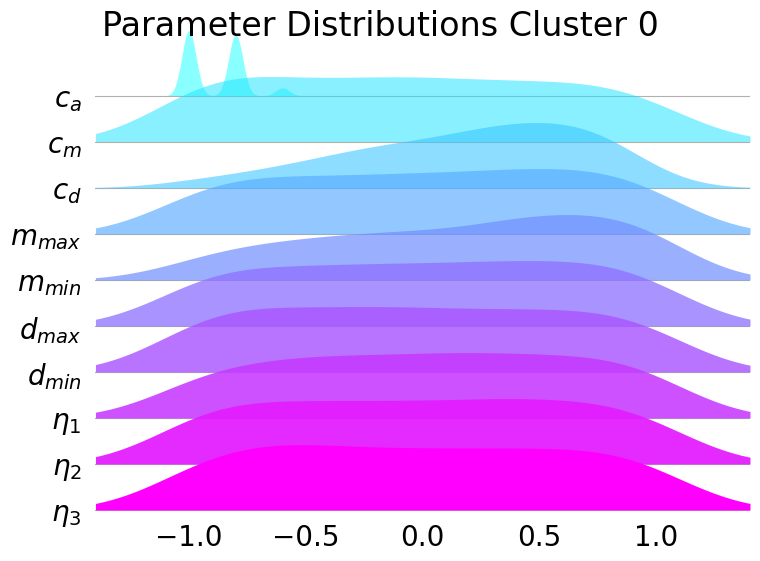

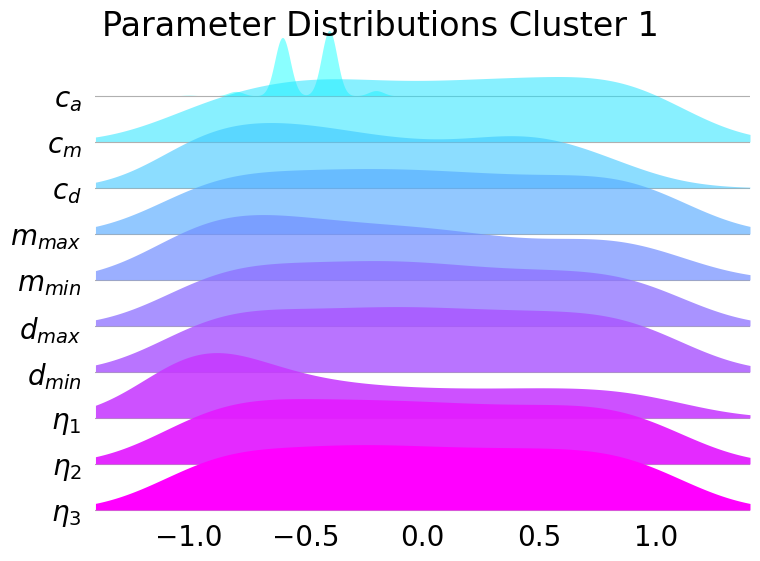

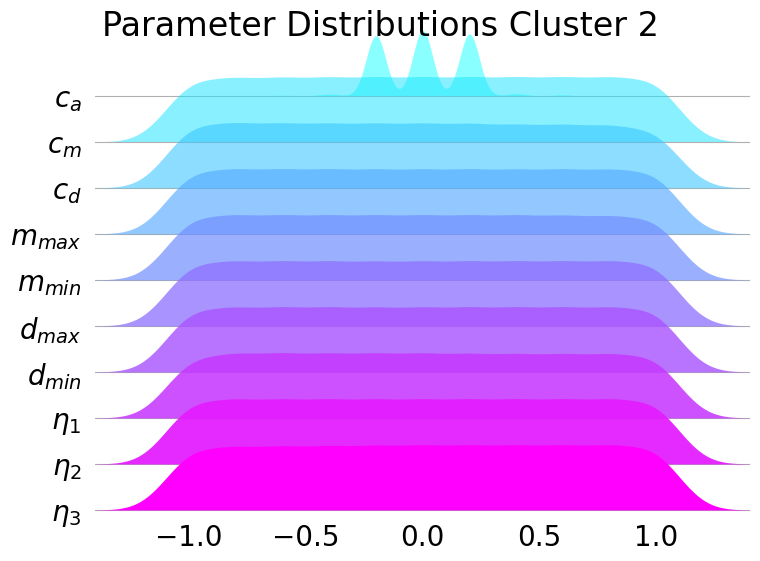

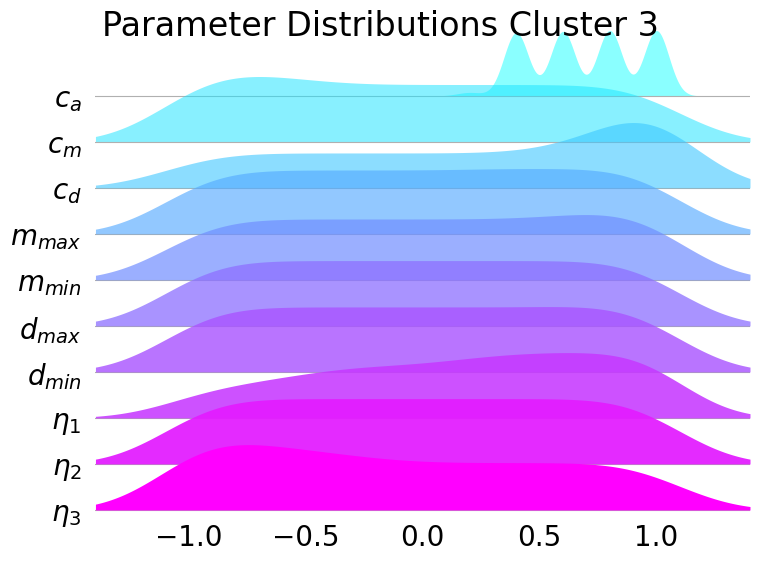

In [8]:
# Using 1/φ as the overlap parameter for ridgeline plots
o = (1+np.sqrt(5))/2
distns_plot = []

for c in np.arange(num_clusters):
    param_distn_plot = {}
    param_distn_plot['$c_a$'] = cluster_distns[c]['c_a']
    param_distn_plot['$c_m$'] = cluster_distns[c]['c_m']
    param_distn_plot['$c_d$'] = cluster_distns[c]['c_d']
    
    param_distn_plot['$m_{max}$'] = cluster_distns[c]['mmax']
    param_distn_plot['$m_{min}$'] = cluster_distns[c]['mmin']
    param_distn_plot['$d_{max}$'] = cluster_distns[c]['dmax']
    param_distn_plot['$d_{min}$'] = cluster_distns[c]['dmin']
    
    param_distn_plot['$\eta_1$'] = cluster_distns[c]['eta1']
    param_distn_plot['$\eta_2$'] = cluster_distns[c]['eta2']
    param_distn_plot['$\eta_3$'] = cluster_distns[c]['eta3']
    distns_plot.append(param_distn_plot)

# Creating Ridgeline plots of parameter distributions in each cluster
for c in range(num_clusters):
    fig, ax = joypy.joyplot(distns_plot[c],
                            colormap = mpl.colormaps['cool'].resampled(10),
                            figsize = (8,6),
                            linecolor='#f0f0f0',
                            bins = 11,
                            grid = 'y',
                            ylabelsize = 20,
                            xlabelsize = 20,
                            ylim ='own',
                            overlap = 1/(2*o),
                            fade=True,
                            linewidth = 0)
    ax[-1].xaxis.set_ticks_position('none')
    fig.suptitle(f"Parameter Distributions Cluster {c}")
    plt.show()
    fig.savefig(f"../figures/dataset2/density_ridgeline_cluster_{c}.png")

# **Cell Counts**

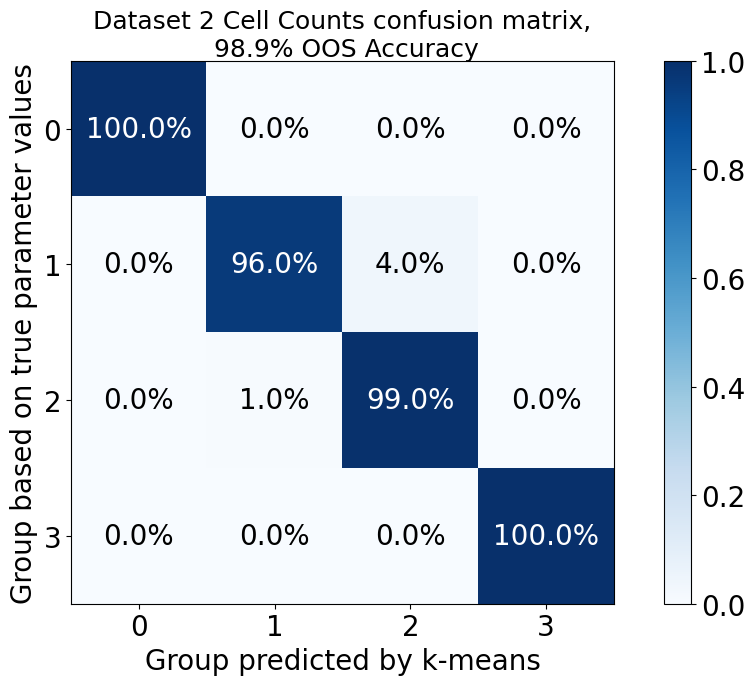

In [9]:
cell_counts = np.load("../data/dataset2/cell_counts.npy",allow_pickle = True)
cell_counts_train, cell_counts_test = split_data(cell_counts, itr_cutoff = 5)
cell_counts_train, cell_counts_test = scale_population_curves(cell_counts_train, cell_counts_test)
cell_counts_train = cell_counts_train.reshape((27225,4*241))
cell_counts_test = cell_counts_test.reshape((27225,4*241))

cell_counts_train_labels = pipeline.fit_predict(cell_counts_train)
cell_counts_predicted_test_labels = pipeline.predict(cell_counts_test)
cell_counts_train_reduced = pca.transform(cell_counts_train)
var = pca.explained_variance_ratio_

with open("../src/parameters.yaml") as p:
        params = yaml.safe_load(p)
        dataset2_info = params["dataset2"]
param_combinations = dataset2_info['parameter_combinations']

labels = {}
c_a_vec = []
c_a_range = np.logspace(np.log2(0.2), np.log2(0.8), 11, base = 2)
for i, combo in enumerate(param_combinations):
    labels[combo] = cell_counts_train_labels[i*605:(i+1)*605].reshape((121,5))
    if 'c_a' in combo.split(','):
        c_a_vec.append(np.repeat(c_a_range,11))
    else:
        c_a_vec.append(np.full(shape = 121,
                               fill_value = 0.4))
c_a_vec = np.array(c_a_vec).flatten()
        
param_labels, _ = generate_param_labels(param_combinations = param_combinations,
                                     labels = labels,
                                     n_iterations = 5,
                                     n_param_value_combos = 121)


common_label = []
for combo in param_labels.keys():
    common_label.append(param_labels[combo])
common_label = np.array(common_label, dtype = int).flatten()

c_a_means = np.zeros(num_clusters)
for c in np.arange(num_clusters):
    c_a_means[c] = np.mean(c_a_vec[common_label == c])


common_label_copy = np.zeros(common_label.shape)
cell_counts_train_labels_copy = np.zeros(cell_counts_train_labels.shape)
cell_counts_predicted_test_labels_copy = np.zeros(cell_counts_predicted_test_labels.shape)

for iold, inew in enumerate(np.argsort(c_a_means)):
    common_label_copy[common_label == inew] = iold
    cell_counts_train_labels_copy[cell_counts_train_labels == inew] = iold
    cell_counts_predicted_test_labels_copy[cell_counts_predicted_test_labels == inew] = iold
    


cm = generate_confusion_matrix(np.repeat(common_label_copy, 5), cell_counts_predicted_test_labels_copy, num_clusters)
cm_fig = plot_confusion_matrix_and_OOS(confusion_matrix = cm,
                                       y_true = np.repeat(common_label_copy, 5),
                                       y_pred = cell_counts_predicted_test_labels_copy,
                                       n_clusters = num_clusters,
                                       xlabel = "Group predicted by k-means",
                                       ylabel = "Group based on true parameter values",
                                       title = "Dataset 2 Cell Counts");  
cm_fig.savefig("../figures/dataset2/cell_counts_confusion_matrix.png")

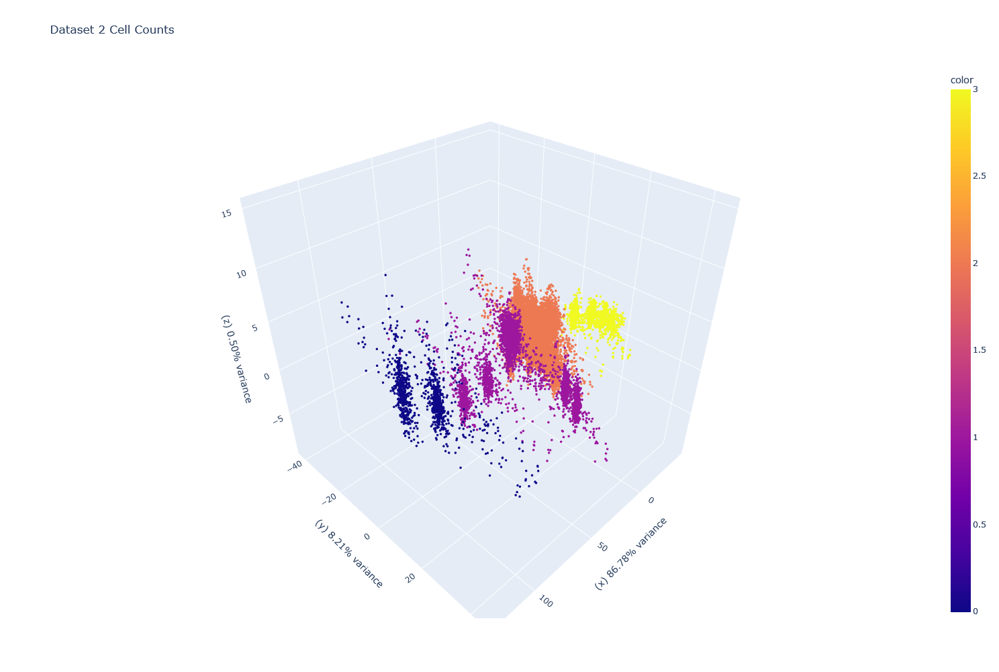

In [10]:
pca_fig = px.scatter_3d(x=cell_counts_train_reduced[:, 0],
                        y=cell_counts_train_reduced[:, 1],
                        z=cell_counts_train_reduced[:, 2],
                        color=cell_counts_train_labels_copy, labels = {'x': f"(x) {100*var[0]:.2f}% variance",
                                                              'y': f"(y) {100*var[1]:.2f}% variance",
                                                              'z':f"(z) {100*var[2]:.2f}% variance"},
                        title = "Dataset 2 Cell Counts")

pca_fig.update_traces(marker={'size': 2})
pca_fig.update_layout(autosize=False,
                             width = 1200,
                             height = 1000)
     
pca_fig.show()

cluster_distns = []
for cluster_num in np.arange(num_clusters):
    cluster_distn = parameter_distributions(labels = cell_counts_train_labels_copy,
                                            cluster_num = cluster_num,
                                            n_itrs = 5)
    cluster_distns.append(cluster_distn)

In [11]:
ks_stats = {}
permutation_test_iterations = 1000
for param in cluster_distns[0].keys():
    ks_stats[param] = []
    for c1 in np.arange(num_clusters):
        for c2 in np.arange(c1 + 1, num_clusters):
            p_val = ks.ks_disc_2sample(samples1 = cluster_distns[c1][param],
                                       samples2 = cluster_distns[c2][param],
                                       iters = permutation_test_iterations)
            ks_stats[param].append(p_val)
    ks_stats[param] = np.array(ks_stats[param])

ks_df = pd.DataFrame.from_dict(data = ks_stats,
                               orient = 'index',
                               columns = [f"({c1},{c2})" for c1 in np.arange(num_clusters) for c2 in np.arange(c1+1, num_clusters)])

ks_df.index = list(ks_stats.keys())

ks_df.to_csv(f'cell_counts_ks_stats_{permutation_test_iterations}.csv')
display(ks_df)

,"(0,1)","(0,2)","(0,3)","(1,2)","(1,3)","(2,3)"
c_a,0.000,0.000,0.000,0.000,0.000,0.000
c_d,0.000,0.001,0.283,0.000,0.000,0.077
c_m,0.969,0.907,0.996,0.113,0.994,0.869
dmax,0.494,0.929,0.995,0.971,0.408,0.915
dmin,0.775,0.929,0.998,0.926,0.792,0.898
mmax,0.545,0.938,0.994,0.958,0.473,0.902
mmin,0.952,0.969,0.999,0.825,0.795,0.903
eta1,0.000,0.000,0.000,0.000,0.000,0.146
eta2,0.977,0.925,0.998,0.515,0.996,0.901
eta3,0.913,0.045,0.202,0.000,0.036,0.728


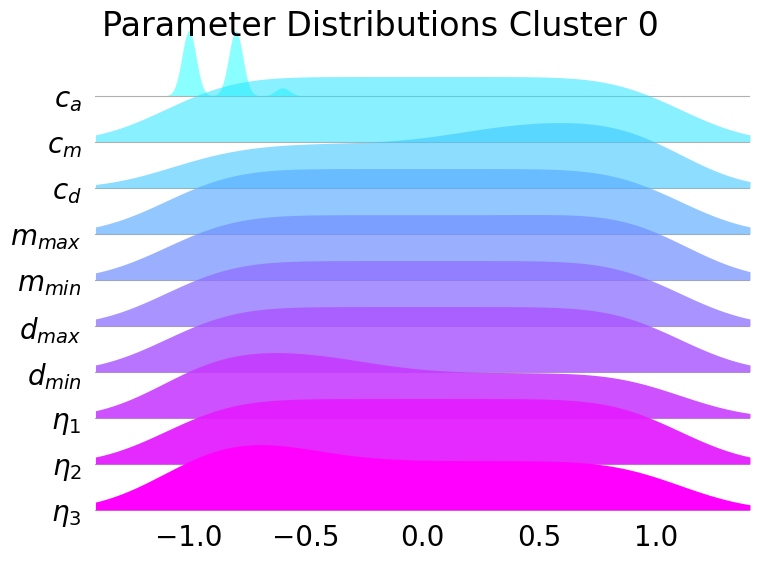

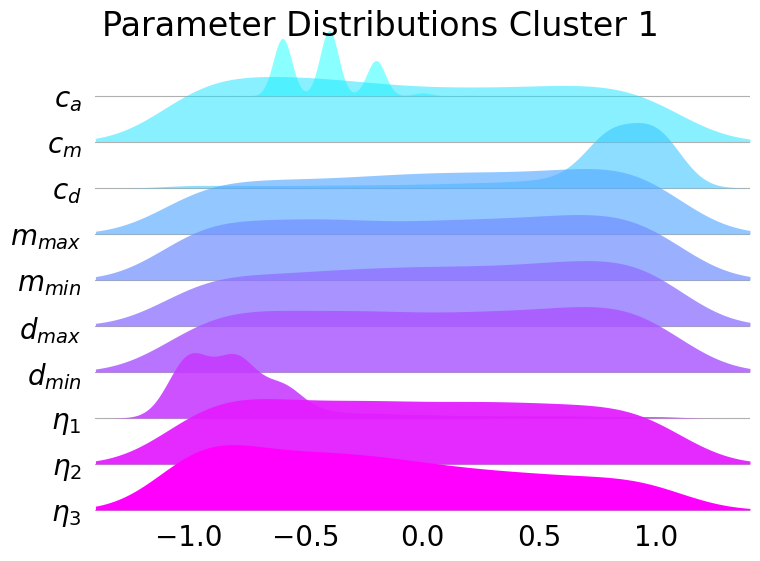

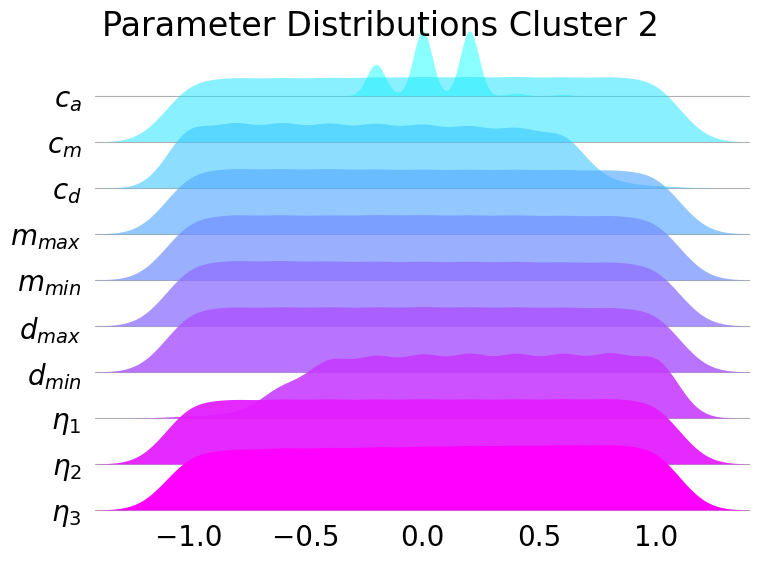

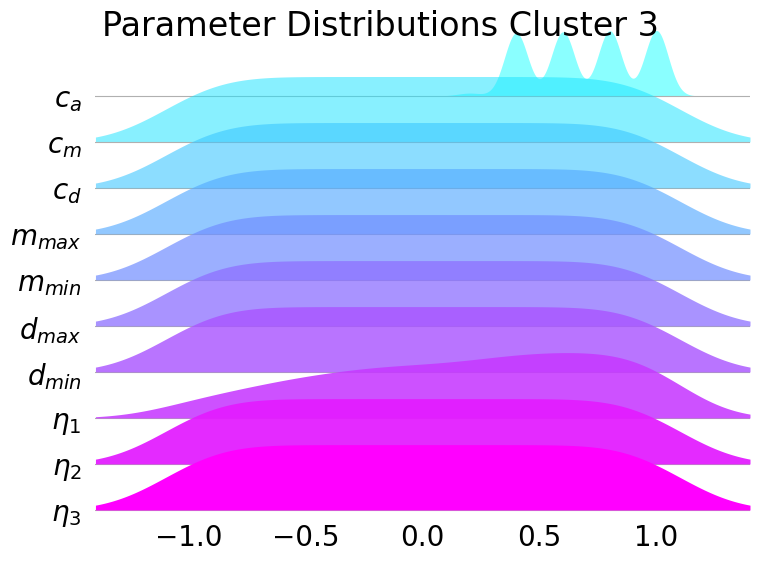

In [12]:
# Using 1/φ as the overlap parameter for ridgeline plots
o = (1+np.sqrt(5))/2
distns_plot = []

for c in np.arange(num_clusters):
    param_distn_plot = {}

    param_distn_plot['$c_a$'] = cluster_distns[c]['c_a']
    param_distn_plot['$c_m$'] = cluster_distns[c]['c_m']
    param_distn_plot['$c_d$'] = cluster_distns[c]['c_d']
    
    param_distn_plot['$m_{max}$'] = cluster_distns[c]['mmax']
    param_distn_plot['$m_{min}$'] = cluster_distns[c]['mmin']
    param_distn_plot['$d_{max}$'] = cluster_distns[c]['dmax']
    param_distn_plot['$d_{min}$'] = cluster_distns[c]['dmin']
    
    param_distn_plot['$\eta_1$'] = cluster_distns[c]['eta1']
    param_distn_plot['$\eta_2$'] = cluster_distns[c]['eta2']
    param_distn_plot['$\eta_3$'] = cluster_distns[c]['eta3']
    distns_plot.append(param_distn_plot)

# Creating Ridgeline plots of parameter distributions in each cluster
for c in range(num_clusters):
    fig, ax = joypy.joyplot(distns_plot[c],
                            colormap = mpl.colormaps['cool'].resampled(10),
                            figsize = (8,6),
                            linecolor='#f0f0f0',
                            bins = 11,
                            grid = 'y',
                            ylabelsize = 20,
                            xlabelsize = 20,
                            ylim ='own',
                            overlap = 1/(2*o),
                            fade=True,
                            linewidth = 0)
    ax[-1].xaxis.set_ticks_position('none')
    fig.suptitle(f"Parameter Distributions Cluster {c}")
    plt.show()
    fig.savefig(f"../figures/dataset2/cell_counts_ridgeline_cluster_{c}.png")